In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math 
# The first question asks us to load the dataset 
# Here df represents the dataset I will work upon and df1 will represent the original dataset before preprocessing 
file_path = r"C:\Users\ARNAV GUPTA\OneDrive\Desktop\New folder (11)\hotel_bookings.csv"
file1_path = r"C:\Users\ARNAV GUPTA\OneDrive\Desktop\New folder (11)\original.csv"
df = pd.read_csv(file_path)
df1 = pd.read_csv(file1_path)
df.head()

,hotel,is_canceled,lead_time,week_no,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,reserved_room_type,assigned_room_type,booking_changes,dept_type,customer_type,adr,reqd_park
0,Resort hotel,0,342.0,27,0,0,2.0,0.0,BB,PRT,Direct,Direct,C,C,3,No Deposit,Transient,0.0,0
1,City Hotel,0,737.0,27,0,0,2.0,0.0,BB,PRT,Direct,Direct,C,C,4,No Deposit,Transient,0.0,0
2,Resort Hotel,0,7.0,27,0,1,1.0,0.0,BB,GBR,Direct,Direct,A,C,0,No Deposit,Transient,75.0,0
3,Resort hotel,0,13.0,27,0,1,1.0,0.0,BB,GBR,Corporate,Corporate,A,A,0,No Deposit,Transient,75.0,0
4,City Hotel,0,14.0,27,0,2,2.0,0.0,BB,GBR,Online TA,TA/TO,A,A,0,No Deposit,Transient,98.0,0


In [26]:
# The second part asks us to inspect the structure of the dataset

print("\nDataset Info:")
print(df1.info())
print("\n\n")
print("\nFirst 5 Rows:")
print(df1.head())
print("\n\n")
print("\nLast 5 Rows:")
print(df1.tail())
print("\n\n")
print("\nShape of Dataset (Rows, Columns):", df1.shape)
print("\n\n")
print("\nColumn Names:", df1.columns.tolist())
print("\n\n")
print("\nData Types:")
print(df1.dtypes)
print("\n\n")
print("\nNumerical Summary:")
print(df1.describe())
print("\n\n")
print("\nCategorical Summary:")
print(df1.describe(include="object"))
print("\n\n")
print("\n Missing Values in Each Column:")
print(df1.isnull().sum())
print("\n\n")
print("\nNumber of Duplicate Rows:", df1.duplicated().sum())
print("\n\n")
print("\nUnique Values in Each Column:")
for col in df1.columns:
    print(f"{col}: {df1[col].nunique()} unique values")


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 919 entries, 0 to 918
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   hotel                    919 non-null    object 
 1   is_canceled              919 non-null    int64  
 2   lead_time                864 non-null    float64
 3   week_no                  919 non-null    int64  
 4   stays_in_weekend_nights  919 non-null    int64  
 5   stays_in_week_nights     919 non-null    int64  
 6   adults                   869 non-null    float64
 7   children                 859 non-null    float64
 8   meal                     919 non-null    object 
 9   country                  919 non-null    object 
 10  market_segment           919 non-null    object 
 11  distribution_channel     919 non-null    object 
 12  reserved_room_type       919 non-null    object 
 13  assigned_room_type       919 non-null    object 
 14  booking_cha

In [27]:
# Our next goal is to remove the null values using imputation techniques or removal techniques 
# we will use the imputation techniques
# We are replacing the null values with the median of the respective columns 
df.fillna(df.median(numeric_only=True), inplace=True)
#we now print the number of null values in the dataframe 
print(df.isnull().sum())

hotel                      0
is_canceled                0
lead_time                  0
week_no                    0
stays_in_weekend_nights    0
stays_in_week_nights       0
adults                     0
children                   0
meal                       0
country                    0
market_segment             0
distribution_channel       0
reserved_room_type         0
assigned_room_type         0
booking_changes            0
dept_type                  0
customer_type              0
adr                        0
reqd_park                  0
dtype: int64


In [28]:
#we now identify the duplicate records 

print("Duplicated Columns in original dataset" , df1.duplicated().sum())
duplicate_rows = df1[df1.duplicated()]
print(f"Number of duplicate rows: {len(duplicate_rows)}")

#we remove the duplicate records 
df.drop_duplicates(inplace = True)

print("Duplicated Columns in new dataset" , df.duplicated().sum())

Duplicated Columns in original dataset 94
Number of duplicate rows: 94
Duplicated Columns in new dataset 0


In [29]:
# we now detect and remove the outliers 
# list of all numeric columns and detection of outliers in them 
numeric_columns = df1.select_dtypes(include=['number']).columns
for column in numeric_columns:
    Q1 = df1[column].quantile(0.25)
    Q3 = df1[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df1[(df1[column] < lower_bound) | (df1[column] > upper_bound)]
    print(f"Number of outliers in {column}: {outliers.shape[0]}")


Number of outliers in is_canceled: 0
Number of outliers in lead_time: 18
Number of outliers in week_no: 0
Number of outliers in stays_in_weekend_nights: 1
Number of outliers in stays_in_week_nights: 20
Number of outliers in adults: 103
Number of outliers in children: 112
Number of outliers in booking_changes: 125
Number of outliers in adr: 35
Number of outliers in reqd_park: 125


In [30]:
#now to remove these outliers , we use the technique of winsortization
def winsorize_series(series, lower_percentile=5, upper_percentile=95):
    lower_bound = np.percentile(series, lower_percentile)
    upper_bound = np.percentile(series, upper_percentile)
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound) 
    return series.clip(lower=lower_bound, upper=upper_bound)

numeric_columns = [col for col in numeric_columns if col in df.columns]
for col in numeric_columns:
    df[col] = winsorize_series(df[col])

numeric_columns = df.select_dtypes(include=['number']).columns
for column in numeric_columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]



In [31]:
#the categorical columns are standardized by converting them to consistent strings
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

def standardize_categories(df, categorical_columns):
    for col in categorical_columns:
        df[col] = df[col].astype(str).str.strip() 
        if col == 'meal':
            df[col] = df[col].str.upper()  
        else:
            df[col] = df[col].str.lower().replace({
                'resort hotel': 'Resort Hotel',
            })
    return df

df = standardize_categories(df, categorical_columns)

In [32]:
#summary statistics 
def custom_skew(series):
    n = len(series)
    mean_x = sum(series) / n
    std_x = (sum((x - mean_x) ** 2 for x in series) / (n - 1)) ** 0.5
    
    if std_x == 0:  
        return 0
    
    skewness = (n / ((n - 1) * (n - 2))) * sum(((x - mean_x) / std_x) ** 3 for x in series)
    return skewness
summary_stats = {}
for column in numeric_columns:
    stats = {
        'Mean': df[column].mean(),
        'Median': df[column].median(),
        'Mode': df[column].value_counts().idxmax(),
        'Skewness': custom_skew(df[column]),
        'Variance': df[column].var()
    }
    summary_stats[column] = stats

# I Converted it to DataFrame for better readability
summary_df = pd.DataFrame(summary_stats).T
print(summary_df)

                               Mean  Median   Mode  Skewness     Variance
is_canceled                0.277363     0.0    0.0  0.996446     0.200682
lead_time                 52.098259    48.0   48.0  0.246503  1133.291703
week_no                   28.934080    29.0   29.0  0.043094     1.605861
stays_in_weekend_nights    1.286070     1.0    2.0 -0.045499     0.956667
stays_in_week_nights       3.446517     3.0    5.0  0.060606     3.749315
adults                     1.993781     2.0    2.0 -0.103480     0.115777
children                   0.184080     0.0    0.0  2.789484     0.279896
booking_changes            0.138060     0.0    0.0  2.102356     0.119147
adr                      125.277873   123.0  195.0  0.273858  1189.085758
reqd_park                  0.144279     0.0    0.0  2.028543     0.123616


In [33]:
#Frequency table for categorical columns 
categorical_columns = df.select_dtypes(include=['object']).columns
frequency_tables = {}
for col in categorical_columns:
    frequency_tables[col] = df[col].value_counts().reset_index()
    frequency_tables[col].columns = [col, 'Frequency']

# Display all frequency tables
for col, table in frequency_tables.items():
    print(f"\nFrequency Distribution for '{col}':")
    print(table)


Frequency Distribution for 'hotel':
          hotel  Frequency
0  Resort Hotel        412
1    city hotel        392

Frequency Distribution for 'meal':
  meal  Frequency
0   BB        603
1   HB        169
2   FB         32

Frequency Distribution for 'country':
   country  Frequency
0      prt        491
1      esp        103
2      gbr         78
3      irl         28
4      fra         16
5      usa         14
6       cn          7
7      deu          6
8      pol          6
9      che          6
10     rus          6
11     dnk          5
12     rou          4
13     nor          4
14     bel          3
15     fin          3
16     bra          3
17     swe          3
18     arg          2
19     moz          2
20     nld          2
21     aus          2
22     ita          2
23     omn          1
24     grc          1
25     est          1
26     cze          1
27     bwa          1
28     lux          1
29     svn          1
30     alb          1

Frequency Distribution for 'ma

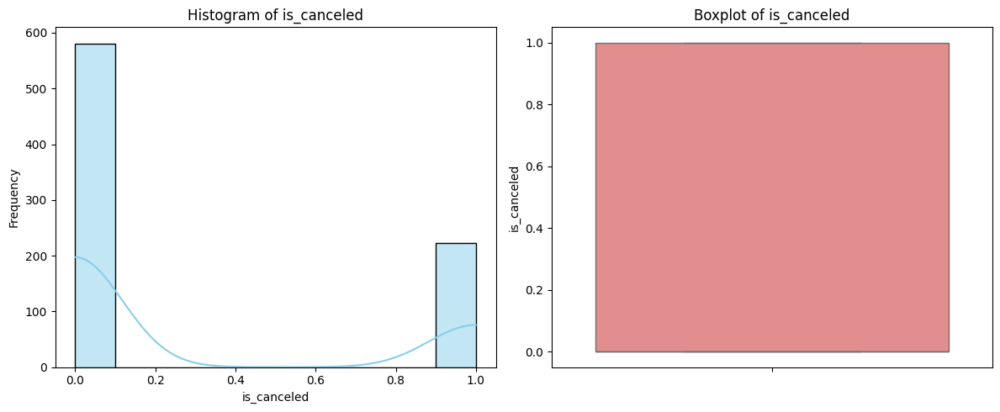

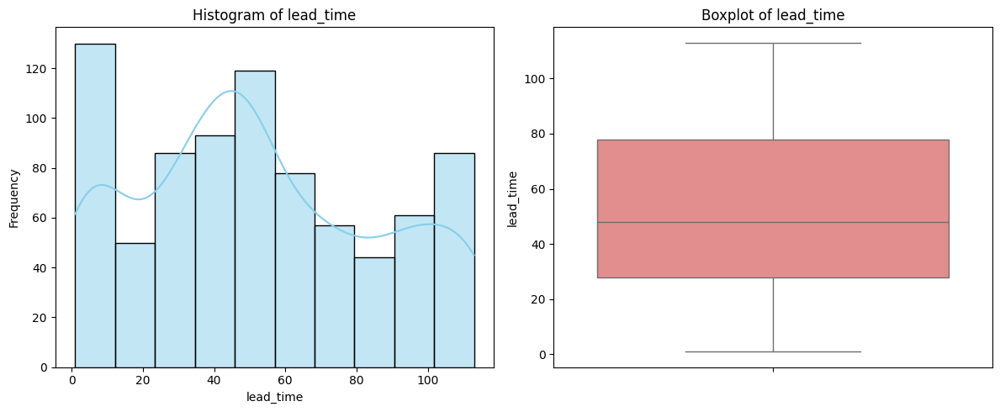

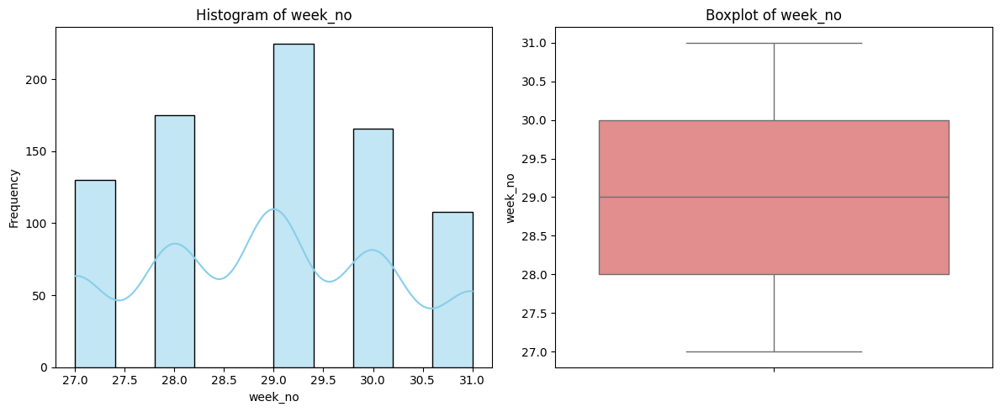

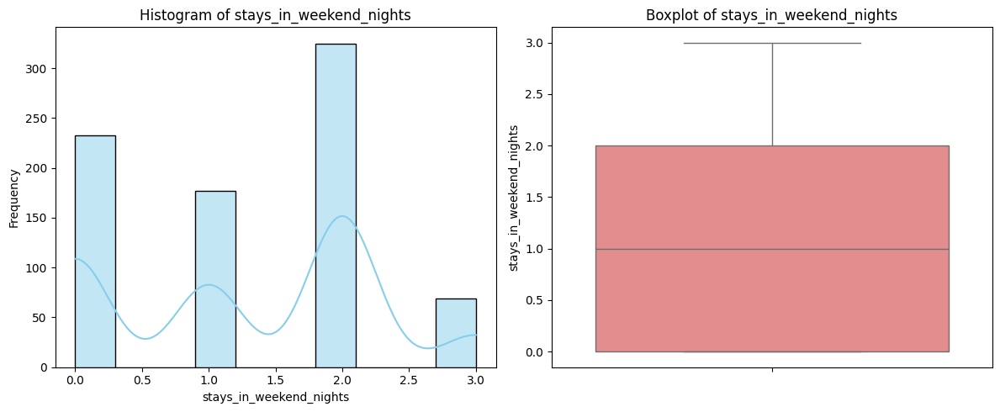

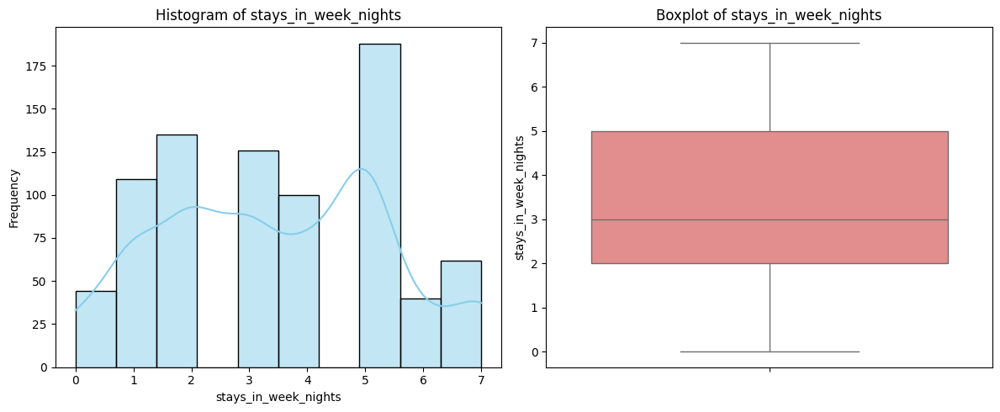

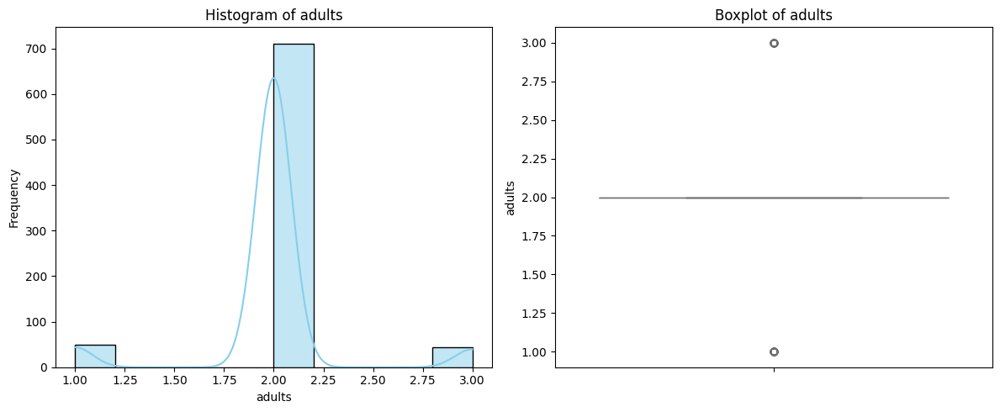

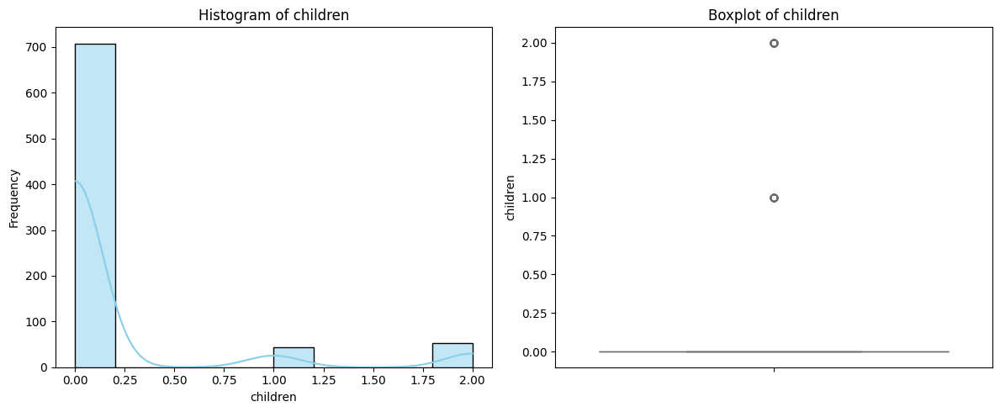

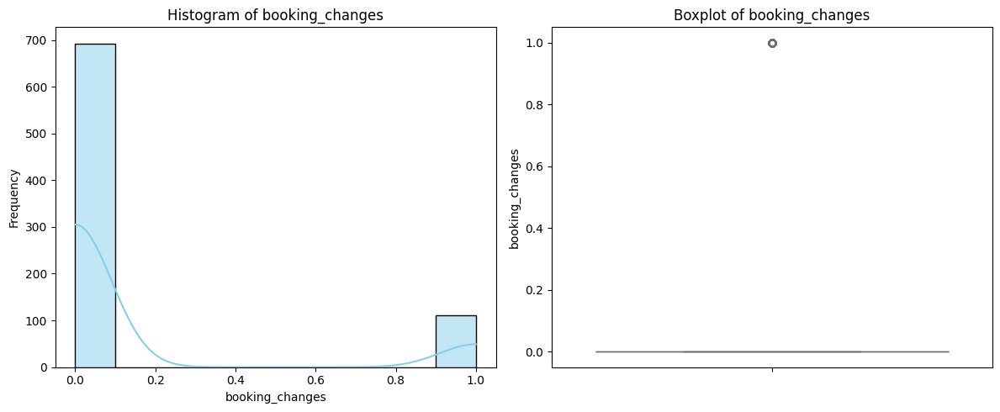

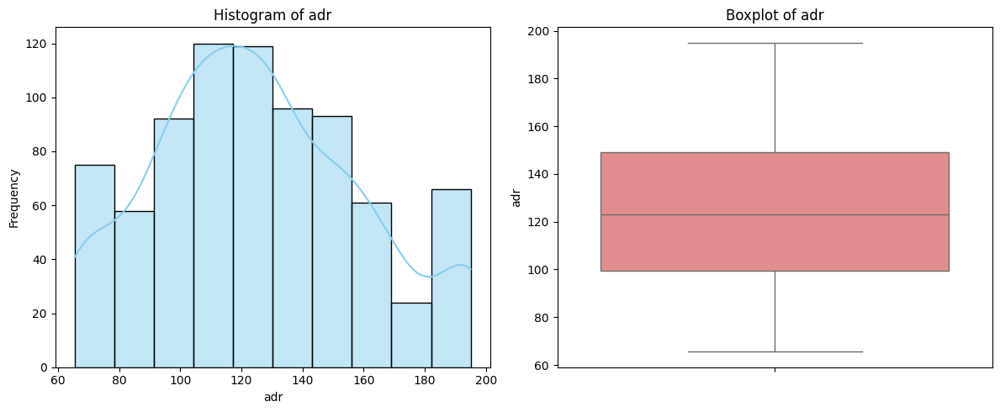

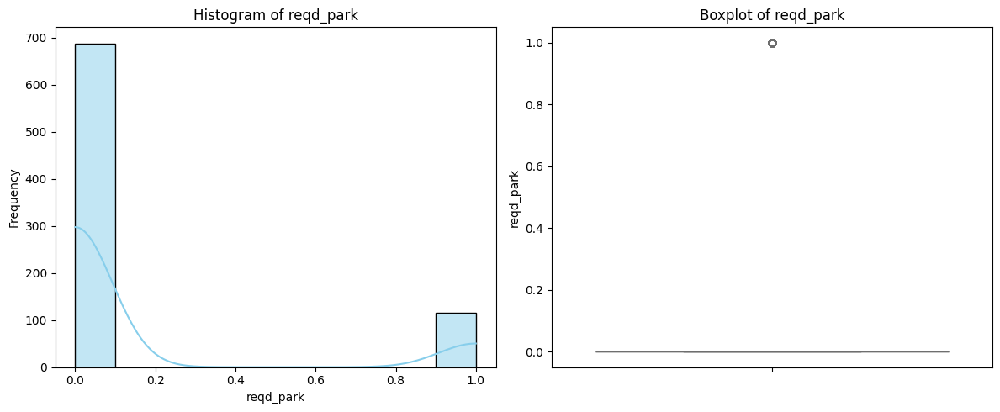

In [34]:
#histograms and boxplots
for column in numeric_columns:
    plt.figure(figsize=(12, 5))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], bins=10, kde=True, color='skyblue')
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    
    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[column], color='lightcoral')
    plt.title(f'Boxplot of {column}')
    
    # visualization
    plt.tight_layout()
    plt.show()

In [35]:
#we compute the correlation matrix for the numeric columns of our dataset
numericdf = df.select_dtypes(include=['number'])
corr_matrix = numericdf.corr().round(3)

# Print correlation matrix
print("Correlation Matrix:")
print(corr_matrix.to_string())

Correlation Matrix:
                         is_canceled  lead_time  week_no  stays_in_weekend_nights  stays_in_week_nights  adults  children  booking_changes    adr  reqd_park
is_canceled                    1.000      0.087    0.190                   -0.031                 0.072   0.003     0.073           -0.159  0.134     -0.254
lead_time                      0.087      1.000   -0.074                    0.359                 0.427   0.100    -0.064            0.070 -0.217     -0.084
week_no                        0.190     -0.074    1.000                   -0.015                -0.007  -0.018     0.052           -0.028  0.367     -0.051
stays_in_weekend_nights       -0.031      0.359   -0.015                    1.000                 0.661   0.050    -0.006            0.060  0.026     -0.001
stays_in_week_nights           0.072      0.427   -0.007                    0.661                 1.000   0.131     0.004            0.073  0.109     -0.075
adults                         0.003  

<Figure size 1200x800 with 0 Axes>

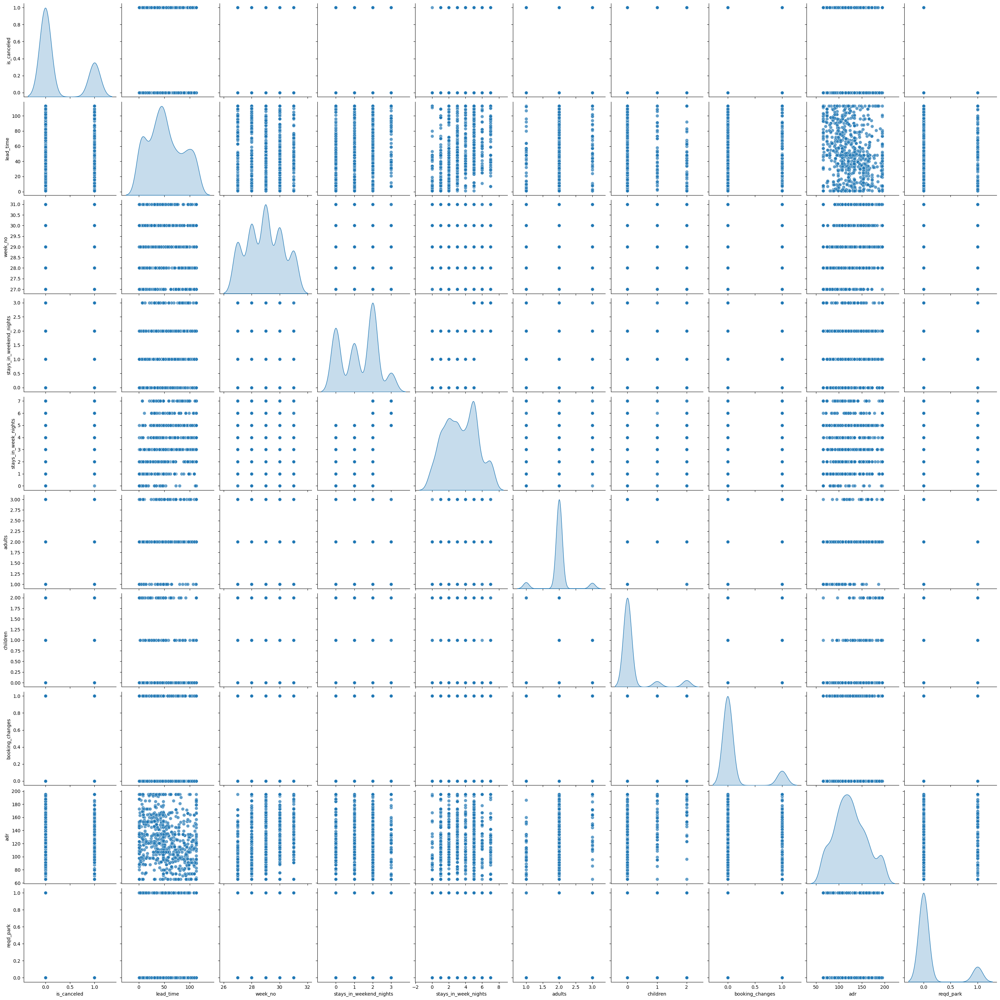

In [36]:
#scatter plaots for all possible combinations 
plt.figure(figsize=(12, 8))

sns.pairplot(numericdf, kind="scatter", diag_kind="kde", height=3, plot_kws={"s": 50, "alpha": 0.7})

plt.show()


In [37]:
num_plots = len(numeric_columns) * len(categorical_columns) * 3
rows = math.ceil(num_plots / 3)
cols = 3

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()

pltidx = 0
for cat_col in categorical_columns:
    for num_col in numeric_columns:
        sns.barplot(x=df[cat_col], y=df[num_col], hue=df[cat_col], estimator=lambda x: sum(x)/len(x), palette="coolwarm", legend=False, ax=axes[pltidx])
        axes[pltidx].set_title(f'Bar Plot of {num_col} by {cat_col}')
        axes[pltidx].tick_params(axis='x', rotation=45)
        pltidx += 1
        sns.violinplot(x=df[cat_col], y=df[num_col], hue=df[cat_col], palette="coolwarm", legend=False, ax=axes[pltidx])
        axes[pltidx].set_title(f'Violin Plot of {num_col} by {cat_col}')
        axes[pltidx].tick_params(axis='x', rotation=45)
        pltidx += 1
        sns.boxplot(x=df[cat_col], y=df[num_col], hue=df[cat_col], palette="coolwarm", legend=False, ax=axes[pltidx])
        axes[pltidx].set_title(f'Box Plot of {num_col} by {cat_col}')
        axes[pltidx].tick_params(axis='x', rotation=45)
        pltidx += 1

for i in range(pltidx, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


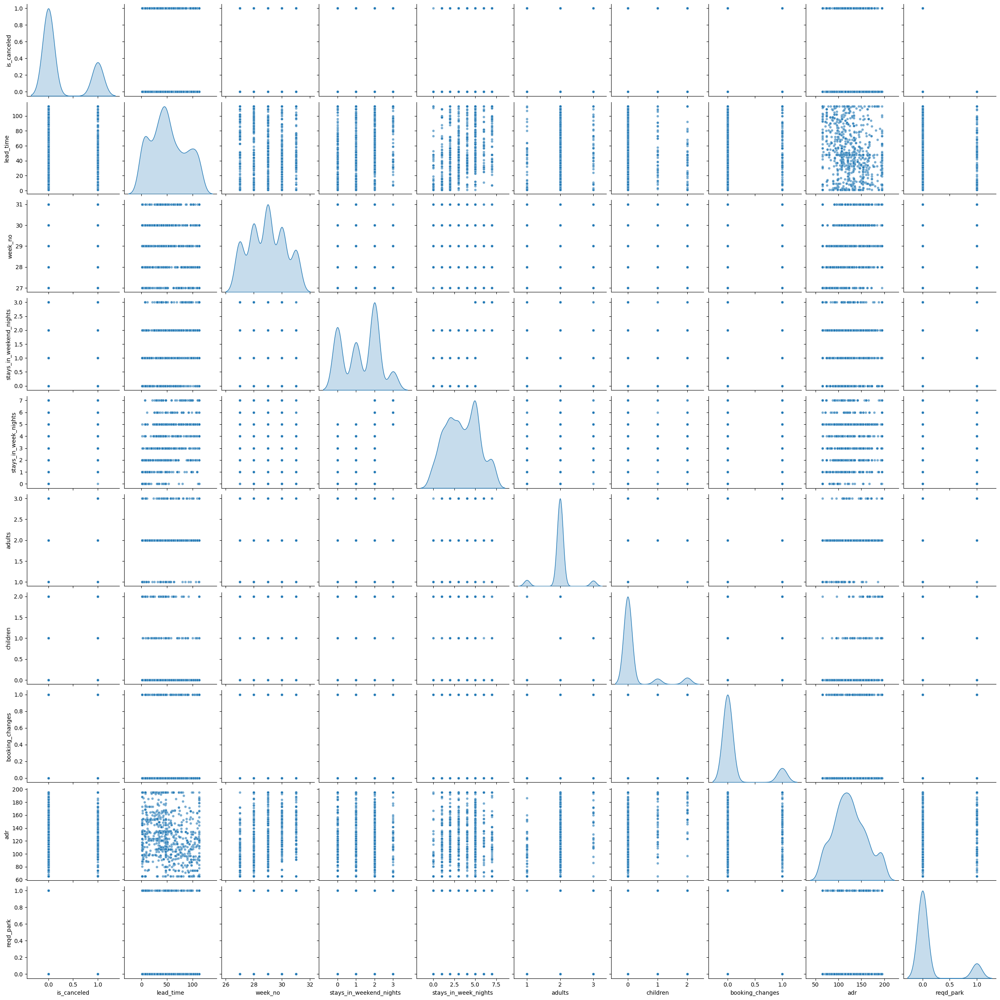

In [38]:
#Piarplots
sns.pairplot(df[numeric_columns], diag_kind='kde', plot_kws={'alpha': 0.6, 's': 20})
plt.show()

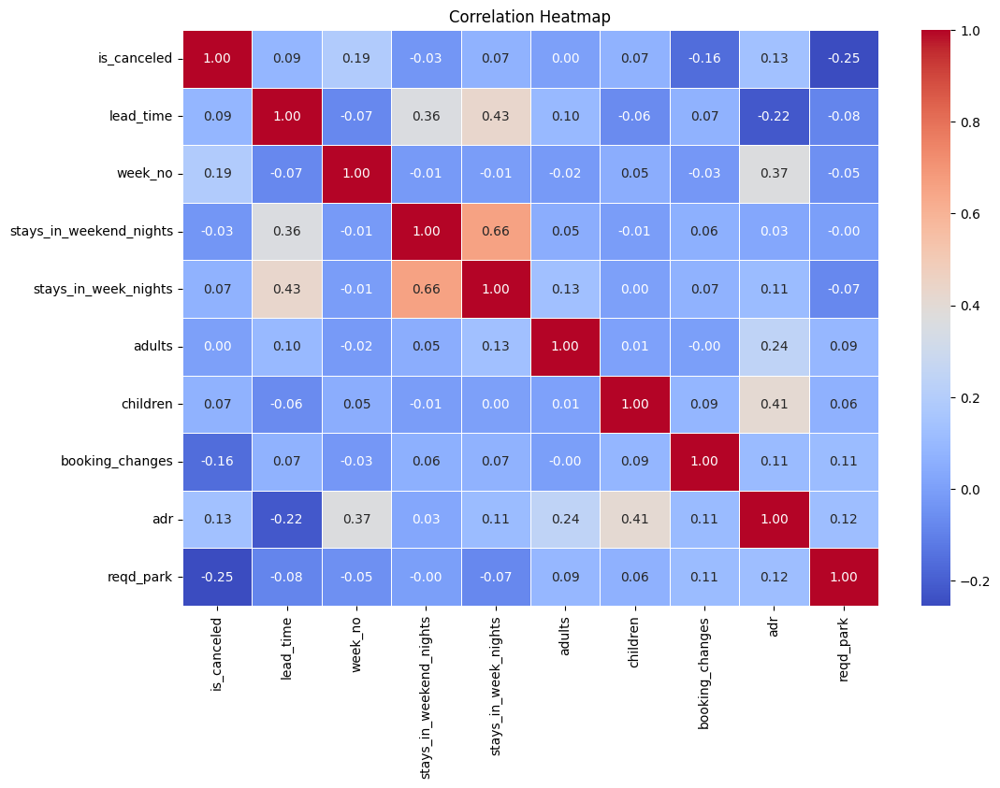

In [39]:
#Heatmaps
plt.figure(figsize=(12, 8))
corr_matrix = df[numeric_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()
#the values on boxes indicate the correlation coefficient 


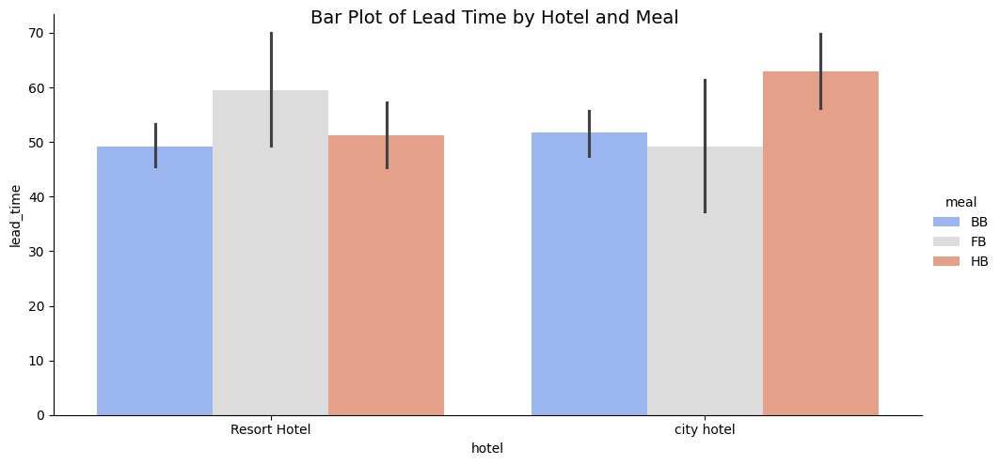

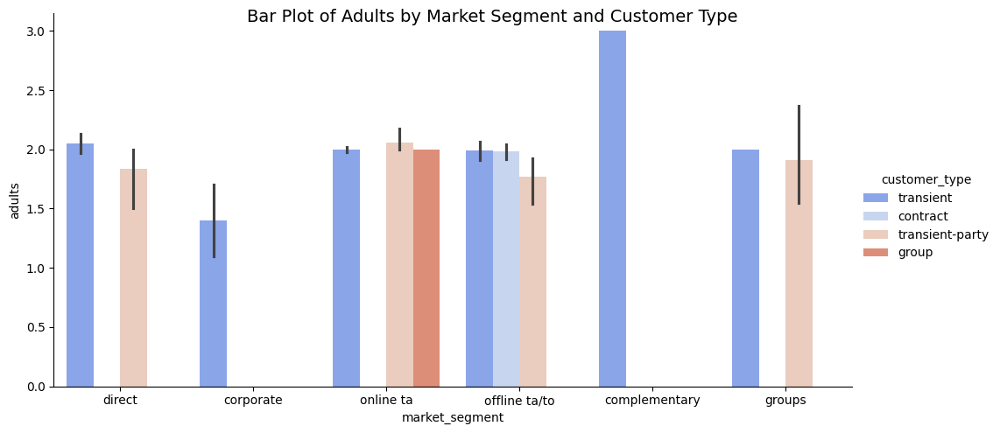

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
#Here I take 2 comparisons for grouped variables analysis.
# First Catplot
g = sns.catplot(
    x="hotel", 
    y="lead_time", 
    hue="meal", 
    kind="bar", 
    data=df, 
    aspect=2, 
    palette="coolwarm"
)

g.fig.suptitle("Bar Plot of Lead Time by Hotel and Meal", fontsize=14)
plt.show()

# Second Catplot
f = sns.catplot(
    x="market_segment",
    y="adults",
    hue="customer_type",
    kind="bar",
    data=df,
    aspect=2,
    palette="coolwarm",
)

f.fig.suptitle("Bar Plot of Adults by Market Segment and Customer Type", fontsize=14)

plt.show()
